In [1]:
import pandas as pd
import numpy as np

import datetime
import time

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio

from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage

import warnings 
warnings.filterwarnings("ignore")

pd.set_option("display.max_columns", None)
sns.set_style('darkgrid')

# **Modeling**

In [2]:
df = pd.read_csv('data/olist_cleaned_dataset.csv')

print('Dataset Shape:',df.shape)
display(df.head())

Dataset Shape: (118310, 28)


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,seller_zip_code_prefix,seller_city,seller_state,product_category_name
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,1.0,credit_card,1.0,18.12,a54f0611adc9ed256b57ede6b6eb5114,4.0,7c396fd4830fd04220f754e42b4e5bff,3149,Sao Paulo,SP,9350.0,Maua,SP,Housewares
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,3.0,voucher,1.0,2.00,a54f0611adc9ed256b57ede6b6eb5114,4.0,7c396fd4830fd04220f754e42b4e5bff,3149,Sao Paulo,SP,9350.0,Maua,SP,Housewares
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,2.0,voucher,1.0,18.59,a54f0611adc9ed256b57ede6b6eb5114,4.0,7c396fd4830fd04220f754e42b4e5bff,3149,Sao Paulo,SP,9350.0,Maua,SP,Housewares
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,1.0,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,1.0,boleto,1.0,141.46,8d5266042046a06655c8db133d120ba5,4.0,af07308b275d755c9edb36a90c618231,47813,Barreiras,BA,31570.0,Belo Horizonte,SP,Perfumery
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,1.0,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,1.0,credit_card,3.0,179.12,e73b67b67587f7644d5bd1a52deb1b01,5.0,3a653a41f6f9fc3d2a113cf8398680e8,75265,Vianopolis,GO,14840.0,Guariba,SP,Auto


In [3]:
# Skimming data
pd.DataFrame({
        'feature': df.columns.values,  # Column names
        'data_type': df.dtypes.values,  # Datatypes of columns
        'null_value(%)': df.isna().mean().values * 100,  # Percentage of missing values
        'neg_value(%)': [len(df[col][df[col] < 0]) / len(df) * 100 if col in df.select_dtypes(include=[np.number]).columns else 0 for col in df.columns],  # Percentage of negative values for numeric columns
        '0_value(%)': [len(df[col][df[col] == 0]) / len(df) * 100 if col in df.select_dtypes(include=[np.number]).columns else 0 for col in df.columns],  # Percentage of zero values for numeric columns
        'duplicate': df.duplicated().sum(),  # Number of duplicated rows
        'n_unique': df.nunique().values,  # Number of unique values for each column
        'sample_unique': [df[col].unique() for col in df.columns]  # Sample unique values for each column
    }).round(3)

,feature,data_type,null_value(%),neg_value(%),0_value(%),duplicate,n_unique,sample_unique
0,order_id,object,0.0,0.0,0.000,0,98666,"[e481f51cbdc54678b7cc49136f2d6af7, 53cdb2fc8bc..."
1,customer_id,object,0.0,0.0,0.000,0,98666,"[9ef432eb6251297304e76186b10a928d, b0830fb4747..."
2,order_status,object,0.0,0.0,0.000,0,7,"[delivered, invoiced, shipped, processing, can..."
3,order_purchase_timestamp,object,0.0,0.0,0.000,0,98112,"[2017-10-02 10:56:33, 2018-07-24 20:41:37, 201..."
4,order_approved_at,object,0.0,0.0,0.000,0,90188,"[2017-10-02 11:07:15, 2018-07-26 03:24:27, 201..."
5,order_delivered_carrier_date,object,0.0,0.0,0.000,0,81363,"[2017-10-04 19:55:00, 2018-07-26 14:31:00, 201..."
6,order_delivered_customer_date,object,0.0,0.0,0.000,0,96050,"[2017-10-10 21:25:13, 2018-08-07 15:27:45, 201..."
7,order_estimated_delivery_date,object,0.0,0.0,0.000,0,450,"[2017-10-18 00:00:00, 2018-08-13 00:00:00, 201..."
8,order_item_id,float64,0.0,0.0,0.000,0,21,"[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, ..."
9,product_id,object,0.0,0.0,0.000,0,32951,"[87285b34884572647811a353c7ac498a, 595fac2a385..."


##  **Features Engineering**

---

Feature engineering is a crucial process in data modeling aimed at improving the quality of features used in statistical or machine learning models. The main goal of feature engineering is to identify, modify, or create features that can assist the model in better understanding and predicting data. The stages in feature engineering modeling include Feature Selection, Feature Extraction, Handling Outlier and Normalization (Scaling).

### **Features Selection**

In [4]:
# Select the columns required for modeling
df = df[['order_id', 'order_item_id', 'customer_unique_id', 'order_purchase_timestamp', 'payment_sequential', 'payment_value']]
df.head()

,order_id,order_item_id,customer_unique_id,order_purchase_timestamp,payment_sequential,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,1.0,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,1.0,18.12
1,e481f51cbdc54678b7cc49136f2d6af7,1.0,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,3.0,2.00
2,e481f51cbdc54678b7cc49136f2d6af7,1.0,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,2.0,18.59
3,53cdb2fc8bc7dce0b6741e2150273451,1.0,af07308b275d755c9edb36a90c618231,2018-07-24 20:41:37,1.0,141.46
4,47770eb9100c2d0c44946d9cf07ec65d,1.0,3a653a41f6f9fc3d2a113cf8398680e8,2018-08-08 08:38:49,1.0,179.12


The features above can be used for RFM (Recency, Frequency, Monetary) analysis and modeling, in accordance with the description provided:

- `order_purchase_timestamp`: This feature can be used to calculate Recency (R) in RFM analysis. By measuring the time difference between the last purchase date and a specific reference date (e.g., the analysis date), you can determine how "recent" a customer's purchase activity is. A smaller Recency value indicates that the customer is more active recently.

- `order_id`: This feature can be used to calculate Frequency (F) in RFM analysis. We can count the number of orders or transactions made by customers by counting the unique occurrences of order_id. A higher Frequency value indicates that the customer makes purchases more frequently.

- `payment_value`: This feature can be used to calculate Monetary (M) in RFM analysis. We can aggregate the total payment value from all transactions made by customers. A larger Monetary value indicates a higher financial contribution from the customer to the revenue.

In [5]:
# Skimming
pd.DataFrame({
    'feature': df.columns.values,  # Column names
    'data_type': df.dtypes.values,  # Datatypes of columns
    'null_value(%)': df.isna().mean().values * 100,  # Percentage of missing values
    'neg_value(%)': [len(df[col][df[col] < 0]) / len(df) * 100 if col in df.select_dtypes(include=[np.number]).columns else 0 for col in df.columns],  # Percentage of negative values for numeric columns
    '0_value(%)': [len(df[col][df[col] == 0]) / len(df) * 100 if col in df.select_dtypes(include=[np.number]).columns else 0 for col in df.columns],  # Percentage of zero values for numeric columns
    'duplicate': df.duplicated().sum(),  # Number of duplicated rows
    'n_unique': df.nunique().values,  # Number of unique values for each column
    'sample_unique': [df[col].unique() for col in df.columns]  # Sample unique values for each column
}).round(3)

,feature,data_type,null_value(%),neg_value(%),0_value(%),duplicate,n_unique,sample_unique
0,order_id,object,0.0,0.0,0.000,706,98666,"[e481f51cbdc54678b7cc49136f2d6af7, 53cdb2fc8bc..."
1,order_item_id,float64,0.0,0.0,0.000,706,21,"[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, ..."
2,customer_unique_id,object,0.0,0.0,0.000,706,95420,"[7c396fd4830fd04220f754e42b4e5bff, af07308b275..."
3,order_purchase_timestamp,object,0.0,0.0,0.000,706,98112,"[2017-10-02 10:56:33, 2018-07-24 20:41:37, 201..."
4,payment_sequential,float64,0.0,0.0,0.000,706,29,"[1.0, 3.0, 2.0, 4.0, 8.0, 5.0, 7.0, 9.0, 6.0, ..."
5,payment_value,float64,0.0,0.0,0.005,706,28938,"[18.12, 2.0, 18.59, 141.46, 179.12, 72.2, 28.6..."


- `Data Size`: The dataset consists of 118,310 entries.
- `Duplicate Data`: There are 706 duplicate entries in the dataset.
- Column `order_id`: There are 98,666 unique values in this column, which is less than the total number of data entries (118,310). This indicates the presence of duplicates in the `order_id` column.
- `Missing Values`: There are no missing values

In [6]:
# Drop duplicates
df.drop_duplicates(inplace=True)

In [7]:
# Select rows in the DataFrame where the combination of the specified columns is duplicated.
df[df.duplicated(subset=['order_id', 'customer_unique_id', 'order_purchase_timestamp', 'payment_value'], keep=False)]

,order_id,order_item_id,customer_unique_id,order_purchase_timestamp,payment_sequential,payment_value
13,e6ce16cb79ec1d90b1da9085a6118aeb,1.0,f2a85dec752b8517b5e58a06ff3cd937,2017-05-16 19:41:10,1.0,259.06
14,e6ce16cb79ec1d90b1da9085a6118aeb,2.0,f2a85dec752b8517b5e58a06ff3cd937,2017-05-16 19:41:10,1.0,259.06
32,acce194856392f074dbf9dada14d8d82,1.0,576ea0cab426cd8a00fad9a9c90a4494,2018-06-04 00:00:13,1.0,227.68
33,acce194856392f074dbf9dada14d8d82,2.0,576ea0cab426cd8a00fad9a9c90a4494,2018-06-04 00:00:13,1.0,227.68
59,9faeb9b2746b9d7526aef5acb08e2aa0,1.0,c77154776ead8e798c2d684205938f71,2018-07-26 14:39:59,1.0,151.04
...,...,...,...,...,...,...
118298,9115830be804184b91f5c00f6f49f92d,1.0,c716cf2b5b86fb24257cffe9e7969df8,2017-10-04 19:57:37,2.0,64.37
118299,9115830be804184b91f5c00f6f49f92d,2.0,c716cf2b5b86fb24257cffe9e7969df8,2017-10-04 19:57:37,1.0,42.42
118300,9115830be804184b91f5c00f6f49f92d,2.0,c716cf2b5b86fb24257cffe9e7969df8,2017-10-04 19:57:37,2.0,64.37
118307,11c177c8e97725db2631073c19f07b62,1.0,5097a5312c8b157bb7be58ae360ef43c,2018-01-08 21:28:27,1.0,441.16


There are duplications in the `order_id` caused by different `order_item_id` or `payment_sequential`. The examples provided are:

- In the first set of data:
    `order_id` e6ce16cb79ec1d90b1da9085a6118aeb has 2 entries with different `order_item_id` (1.0 and 2.0) but the same `payment_sequential` (1.0).

- In the second set of data:
    `order_id` 9115830be804184b91f5c00f6f49f92d has 2 entries with different `payment_sequential` (1.0 and 2.0) but the same `order_item_id` (2.0).

This indicates that the duplication in `order_id` can be caused by different combinations of `order_item_id` and `payment_sequential`. To address this, we can drop duplicates based on the same `payment_sequential` and sum the `payment_value` only for entries with different `payment_sequential`.

In [8]:
# Drop duplicates based on the specified columns to keep unique combinations.
df.drop_duplicates(subset=['order_id', 'customer_unique_id', 'order_purchase_timestamp', 'payment_value'], inplace=True)

# Drop unnecessary columns
df.drop(columns=['order_item_id', 'payment_sequential'], inplace=True)

# Group the DataFrame by specified columns and sum the 'payment_value' for each group.
df = df.groupby(['order_id', 'customer_unique_id', 'order_purchase_timestamp']).sum().reset_index()
df

,order_id,customer_unique_id,order_purchase_timestamp,payment_value
0,00010242fe8c5a6d1ba2dd792cb16214,871766c5855e863f6eccc05f988b23cb,2017-09-13 08:59:02,72.19
1,00018f77f2f0320c557190d7a144bdd3,eb28e67c4c0b83846050ddfb8a35d051,2017-04-26 10:53:06,259.83
2,000229ec398224ef6ca0657da4fc703e,3818d81c6709e39d06b2738a8d3a2474,2018-01-14 14:33:31,216.87
3,00024acbcdf0a6daa1e931b038114c75,af861d436cfc08b2c2ddefd0ba074622,2018-08-08 10:00:35,25.78
4,00042b26cf59d7ce69dfabb4e55b4fd9,64b576fb70d441e8f1b2d7d446e483c5,2017-02-04 13:57:51,218.04
...,...,...,...,...
98661,fffc94f6ce00a00581880bf54a75a037,0c9aeda10a71f369396d0c04dce13a64,2018-04-23 13:57:06,343.40
98662,fffcd46ef2263f404302a634eb57f7eb,0da9fe112eae0c74d3ba1fe16de0988b,2018-07-14 10:26:46,386.53
98663,fffce4705a9662cd70adb13d4a31832d,cd79b407828f02fdbba457111c38e4c4,2017-10-23 17:07:56,116.85
98664,fffe18544ffabc95dfada21779c9644f,eb803377c9315b564bdedad672039306,2017-08-14 23:02:59,64.71


After performing the operation to drop duplicates and grouping based on the `order_id` column, now we have a DataFrame that reflects the number of data entries corresponding to the unique `order_id` values. In this case, the number of rows in the DataFrame is 98,666 (down from the original 118,310), matching the count of unique `order_id` values. hese are the features that will be used for the RFM modeling later on.

In [9]:
df.isna().sum()

order_id                    0
customer_unique_id          0
order_purchase_timestamp    0
payment_value               0
dtype: int64

There are no missing values in the DataFrame (df) under analysis. This means that all columns (`order_id`, `customer_unique_id`, `order_purchase_timestamp`, and `payment_value`) in the dataset have values available for every data row.

In [10]:
# Check if there are any remaining rows where 'payment_value' is equal to 0
df[df['payment_value']==0].sum()

order_id                    0.0
customer_unique_id          0.0
order_purchase_timestamp    0.0
payment_value               0.0
dtype: float64

In [11]:
# Convert column to datetime format.
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'])

# Extract the date component 
df['order_purchase_timestamp'] = df['order_purchase_timestamp'].dt.date

# Sort the DataFrame by 'order_purchase_timestamp' and 'order_id'.
df.sort_values(by=['order_purchase_timestamp', 'order_id'], inplace=True)

# Reset the index of the DataFrame to ensure a sequential index.
df.reset_index(drop=True, inplace=True)
df

,order_id,customer_unique_id,order_purchase_timestamp,payment_value
0,2e7a8482f6fb09756ca50c10d7bfc047,b7d76e111c89f7ebf14761390f0f7d17,2016-09-04,136.23
1,e5fa5a7210941f7d56d0208e4e071d35,4854e9b3feff728c13ee5fc7d1547e92,2016-09-05,75.06
2,bfbd0f9bdef84302105ad712db648a6c,830d5b7aaa3b6f1e9ad63703bec97d23,2016-09-15,143.46
3,71303d7e93b399f5bcd537d124c0bcfa,0eb1ee9dba87f5b36b4613a65074337c,2016-10-02,109.34
4,3b697a20d9e427646d92567910af6d57,32ea3bdedab835c3aa6cb68ce66565ef,2016-10-03,45.46
...,...,...,...,...
98661,c84d88553f9878bf2c7ecda2eb211ece,f80013faf776e37bcea7634d59c2181e,2018-08-29,74.21
98662,d03ca98f59480e7e76c71fa83ecd8fb6,0421e7a23f21e5d54efed456aedbc513,2018-08-29,119.42
98663,d70442bc5e3cb7438da497cc6a210f80,21dbe8eabd00b34492a939c540e2b1a7,2018-08-29,14.29
98664,fb393211459aac00af932cd7ab4fa2cc,b4dcade04bc548b7e3b0243c801f8c26,2018-08-29,106.95


### **Feature Extraction**

Feature extraction is the process of creating new features from existing ones or transforming the existing features in a dataset to capture more relevant information or reduce dimensionality. In the context of RFM analysis, feature extraction involves transforming the given features into Recency (R), Frequency (F), and Monetary (M) features.

- **Recency**: Recency measures how recently customers made a purchase. 
- **Frequency**: Frequency measures how often customers make purchases. 
- **Monetary**: Monetary measures the total value of purchases made by customers.

In [12]:
display(df.head())
print('Total Customers:',df['customer_unique_id'].nunique())

,order_id,customer_unique_id,order_purchase_timestamp,payment_value
0,2e7a8482f6fb09756ca50c10d7bfc047,b7d76e111c89f7ebf14761390f0f7d17,2016-09-04,136.23
1,e5fa5a7210941f7d56d0208e4e071d35,4854e9b3feff728c13ee5fc7d1547e92,2016-09-05,75.06
2,bfbd0f9bdef84302105ad712db648a6c,830d5b7aaa3b6f1e9ad63703bec97d23,2016-09-15,143.46
3,71303d7e93b399f5bcd537d124c0bcfa,0eb1ee9dba87f5b36b4613a65074337c,2016-10-02,109.34
4,3b697a20d9e427646d92567910af6d57,32ea3bdedab835c3aa6cb68ce66565ef,2016-10-03,45.46


Total Customers: 95420


In [13]:
# Print the maximum order purchase timestamp
print('Last transaction:', df['order_purchase_timestamp'].max())

# Calculate the next day after the maximum order purchase timestamp to determine the reference date for recency calculation.
max_day = df['order_purchase_timestamp'].max() + datetime.timedelta(days=1)

# Group the DataFrame by 'customer_unique_id' and aggregate RFM metrics.
rfm_data = df.groupby('customer_unique_id').agg(
    last_order=('order_purchase_timestamp', 'max'),  # Calculate the last order date for each customer.
    recency=('order_purchase_timestamp', lambda x: (max_day - x.max()).days),  # Calculate recency in days.
    frequency=('order_id', lambda x: x.nunique()),  # Calculate the count of unique orders for each customer.
    monetary=('payment_value', 'sum')  # Calculate the total monetary value for each customer.
).reset_index()

# Display the resulting RFM data.
rfm_data

Last transaction: 2018-09-03


,customer_unique_id,last_order,recency,frequency,monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10,117,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07,120,1,27.19
2,0000f46a3911fa3c0805444483337064,2017-03-10,543,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12,327,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14,294,1,196.89
...,...,...,...,...,...
95415,fffcf5a5ff07b0908bd4e2dbc735a684,2017-06-08,453,1,2067.42
95416,fffea47cd6d3cc0a88bd621562a9d061,2017-12-10,268,1,84.58
95417,ffff371b4d645b6ecea244b27531430a,2017-02-07,574,1,112.46
95418,ffff5962728ec6157033ef9805bacc48,2018-05-02,125,1,133.69


- The value in the `recency` feature is obtained by calculating the time difference between one day after the last purchase date (the highest date in the `order_purchase_timestamp` column) and the customer's latest transaction date.

- The value in the `frequency` feature is obtained by counting the number of unique orders or transactions (order_id) for each customer.

- The value in the `monetary` feature is obtained by summing the total payment value (payment value) for each customer.

### **Handling Outlier**

In [14]:
def calculate_outliers(data, column):
    # Calculate the first quartile (Q1)
    Q1 = data[column].quantile(0.25)
    # Calculate the third quartile (Q3)
    Q3 = data[column].quantile(0.75)
    # Calculate the interquartile range (IQR)
    IQR = Q3 - Q1
    # Define the lower bound for outliers
    lower_bound = Q1 - 1.5 * IQR
    # Define the upper bound for outliers
    upper_bound = Q3 + 1.5 * IQR
    # Identify the outliers: values that fall below the lower bound or above the upper bound
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    # Return the outliers and the bounds
    return outliers, lower_bound, upper_bound

# Initialize an empty list to store outlier data
outlier_data = []

# Loop through each numeric column in the DataFrame
for column in rfm_data.select_dtypes(include=[np.number]).columns:
    # Calculate outliers for the column
    outlier_result, lower_bound, upper_bound = calculate_outliers(rfm_data, column)
    # Count the total number of outliers
    total_outlier = len(outlier_result)
    # Calculate the percentage of outliers in relation to the total number of data points
    outlier_percentage = round(total_outlier / len(rfm_data[column]) * 100, 2)
    # Append the results to the outlier_data list
    outlier_data.append([column, total_outlier, outlier_percentage, lower_bound, upper_bound])

# Create a DataFrame to neatly display the results
pd.DataFrame(outlier_data, columns=["Column", "Total Outliers", "Percentage (%)", "Lower Bound", "Upper Bound"])

,Column,Total Outliers,Percentage (%),Lower Bound,Upper Bound
0,recency,3,0.00,-231.0000,705.0000
1,frequency,2913,3.05,1.0000,1.0000
2,monetary,7601,7.97,-117.0075,363.0125


- Recency: 3 outliers, which is virtually 0% of the data. This indicates that nearly all customers fall within a typical range of purchase recency.
- Frequency: 2,913 outliers, constituting 3.05% of the data. This suggests that a small but notable percentage of customers purchase more frequently than the average.
- Monetary: 7,601 outliers, making up 7.97% of the data. This indicates that a relatively larger percentage of customers have spent amounts that are significantly different from the norm, either much lower or much higher.

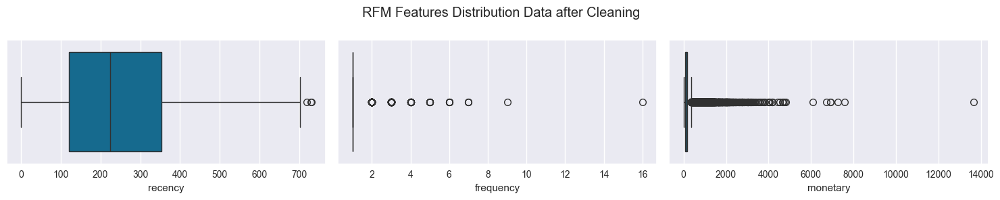

,count,mean,std,min,1%,5%,10%,25%,50%,75%,90%,95%,99%,max
recency,95420.0,244.501457,153.160850,1.00,15.00,29.00,48.00,120.0,225.00,354.000,473.000,527.000,582.0000,730.00
frequency,95420.0,1.034018,0.211234,1.00,1.00,1.00,1.00,1.0,1.00,1.000,1.000,1.000,2.0000,16.00
monetary,95420.0,165.886385,228.241395,6.18,22.69,32.61,40.09,63.0,107.85,183.005,319.005,473.436,1110.5159,13664.08


In [15]:
# Plotting oulier for numerical columns
fig, axs = plt.subplots(ncols=3, nrows=1, figsize=(15,3))
index = 0
axs = axs.flatten()
for col, val in rfm_data.select_dtypes(include=[np.number]).items():
    # Create a boxplot for the current column and assign it to the current subplot axis
    sns.boxplot(x=col, data=rfm_data, ax=axs[index])
    index += 1
plt.suptitle('RFM Features Distribution Data after Cleaning')
plt.tight_layout()
plt.show()

# Generate descriptive statistics for the numerical columns of rfm_data
rfm_data.describe([0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99]).T

**Recency**:

- Most customers have a recency value of around 300 or less, indicating that they have made a transaction relatively recently. There are some outliers who have not made a transaction for a longer time. The distribution is skewed to the right, meaning there are customers with very high recency values, which could indicate lost or inactive customers.

- The mean is approximately 244 days, but there is a large standard deviation (153), indicating wide variance in the days since last purchase. A median (50th percentile) of 225 days suggests that half of the customers have purchased more recently than this.

**Frequency**:

- The minimum percentile, as well as from the 5th to the 95th percentile, are all 1. This means that up to 95% of customers make only one purchase in a given time period. The 99th percentile is at 2, showing that very few customers made more than one purchase.

- The frequency plot indicates that the customer base does not have a habit of repeat purchases, with a maximum frequency of 16 being an extreme outlier.


**Monetary**:


- The average monetary value is approximately 165.88, with a standard deviation of 228.24, indicating a significant variation in the amount of money customers spend.

- The distribution is highly skewed to the right, with most customers spending in the lower monetary range (median of 107.85) and very few customers spending at the higher end. There's a noticeable jump in spending at the higher percentiles, with the 95th percentile spending 473.43, and the 99th percentile spending over 1110.51, which is more than ten times the median spending.

- There's a long tail on the monetary boxplot, showing that a small number of customers spend much more than the average, with a few extreme spenders (up to 13,664.08).

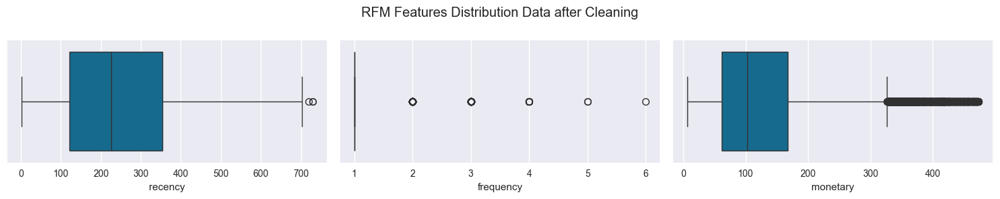

In [16]:
# Filter the rfm_data DataFrame to exclude outliers in the 'monetary' column.
# This is done by keeping only those rows where the 'monetary' value is less than the 95th percentile of the 'monetary' column's values.
# Essentially, this trims the top 5% of the highest 'monetary' values, which are considered extreme outliers.
rfm_data = rfm_data[rfm_data['monetary']<rfm_data['monetary'].quantile(0.95)]

# Plotting oulier for numerical columns
fig, axs = plt.subplots(ncols=3, nrows=1, figsize=(15,3))
index = 0
axs = axs.flatten()
for col, val in rfm_data.select_dtypes(include=[np.number]).items():
    sns.boxplot(x=col, data=rfm_data, ax=axs[index])
    index += 1
plt.suptitle('RFM Features Distribution Data after Cleaning')
plt.tight_layout()
plt.show()

### **Normalization (Scalling)**

Normalization (scaling) is a data processing process performed to change the scale or range of data, so that the features have uniform values or are within a specific range. The use of normalization (scaling) prevents bias in machine learning, which is highly sensitive to differences in scale between features. For example, algorithms like K-Means Clustering that rely on distances in their modeling process. Feature normalization or scalling will be done using Standard Scaler.

In [17]:
# Select only the relevant columns ('recency', 'frequency', 'monetary') from rfm_data for scaling.
rfm_cleaned = rfm_data[['customer_unique_id', 'recency','frequency','monetary']]

# Initialize an instance of the StandardScaler, which standardizes features by removing the mean and scaling to unit variance.
scaler = StandardScaler()

# The fit_transform method first calculates the mean and std dev for each feature, then transforms the data.
rfm_scaled = pd.DataFrame(data=scaler.fit_transform(rfm_cleaned[['recency','frequency','monetary']]), columns=['recency', 'frequency', 'monetary'])

rfm_scaled.head()

,recency,frequency,monetary
0,-0.834084,-0.161582,0.158610
1,-0.814478,-0.161582,-1.115390
2,1.949943,-0.161582,-0.459787
3,0.538324,-0.161582,-0.932914
4,0.322660,-0.161582,0.769343


## **RFM Segmentation**
---

In [18]:
# These are the labels for the scoring, with 1 being the lowest and 5 being the highest.
# Note that for Recency, a lower recency is better, hence the reverse ordering of labels.
R_Labels = [5,4,3,2,1]
F_Labels = [1,2,3,4,5]
M_Labels = [1,2,3,4,5]

# Split the 'recency' column into 5 segments with equal frequency (quintiles),
rfm_data['R_Score'] = pd.qcut(rfm_data['recency'], q=5, labels= R_Labels).astype(int)\

# Split the 'frequency' column into 5 bins with equal interval width,
rfm_data['F_Score'] = pd.cut(rfm_data['frequency'], bins=5, labels= F_Labels).astype(int)

# Split the 'monetary' column into 5 segments with equal frequency (quintiles),
rfm_data['M_Score'] = pd.qcut(rfm_data['monetary'], q=5, labels= M_Labels).astype(int)

# Combine R_Score, F_Score, M_Score into RFM_Score
rfm_data['RFM_Score'] = rfm_data['R_Score'].astype(str) + rfm_data['F_Score'].astype(str) + rfm_data['M_Score'].astype(str)

rfm_data.head()

,customer_unique_id,last_order,recency,frequency,monetary,R_Score,F_Score,M_Score,RFM_Score
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10,117,1,141.90,4,1,4,414
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07,120,1,27.19,4,1,1,411
2,0000f46a3911fa3c0805444483337064,2017-03-10,543,1,86.22,1,1,3,113
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12,327,1,43.62,2,1,1,211
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14,294,1,196.89,2,1,5,215


In [19]:
def get_segment(score):
     # Define segments with corresponding RFM scores. Each segment is a list of specific score combinations.
    segments = {
        'Champions': [555, 554, 544, 545, 454, 455, 445],
        'Loyal': [543, 444, 435, 355, 354, 345, 344, 335],
        'Potential Loyalist': [553, 551, 552, 541, 542, 533, 532, 531, 452, 451, 442, 441, 
                               431, 453, 433, 432, 423, 353, 352, 351, 342, 341, 333, 323],
        'New Customers': [512, 511, 422, 421, 412, 411, 311],
        'Promising': [525, 524, 523, 522, 521, 515, 514, 513, 425, 424, 413, 414, 415, 
                      315, 314, 313],
        'Need Attention': [535, 534, 443, 434, 343, 334, 325, 324],
        'About To Sleep': [331, 321, 312, 221, 213, 231, 241, 251],
        'Cannot Lose Them': [255, 254, 245, 244, 253, 252, 243, 242, 235, 234, 225, 224, 153, 
                    152, 145, 143, 142, 135, 134, 133, 125, 124],
        'At Risk': [155, 154, 144, 214, 215, 115, 114, 113],
        'Hibernating Customers': [332, 322, 233, 232, 223, 222, 132, 123, 122, 212, 211],
        'Lost Customers': [111, 112, 121, 131, 141, 151]
    }

    for segment, scores in segments.items():
        if score in scores:
            return segment

start_time = time.time()        
# Convert the 'RFM_Score' to integer and apply the 'get_segment' function to each row
rfm_data['RFM_segment'] = rfm_data['RFM_Score'].astype(int).apply(get_segment)
end_time = time.time()
rfm_time = end_time - start_time

# Count the number of customers in each segment and display the result
rfm_data['RFM_segment'].value_counts()

Promising                33081
New Customers            17809
At Risk                  17626
Lost Customers            7532
Hibernating Customers     7402
About To Sleep            7121
Cannot Lose Them            44
Need Attention              30
Champions                    2
Potential Loyalist           1
Loyal                        1
Name: RFM_segment, dtype: int64

In this step, we perform some data preprocessing steps to prepare our customer data for RFM analysis.

- **Labeling RFM Scores**: Firstly, we assign labels for the Recency (R), Frequency (F), and Monetary (M) scores. We decided to give lower scores to lower values and higher scores to higher values. For Recency, we use reverse order because lower Recency values are better.

- **Recency, Frequency, and Monetary Score Calculation**: Then, we divide the Recency column into 5 segments with equal frequency (quintiles), Frequency into 5 bins with the same width interval, and Monetary into 5 segments with equal frequency. This is done so that each customer gets a score based on their combination of Recency, Frequency, and Monetary.

- **Combining RFM Scores**: After calculating the Recency, Frequency, and Monetary scores, we combine them into a single RFM Score in string format. The result will be used to group customers into segments based on their behavior.

- **Segment Definition**n: We have defined several segments such as 'Champions,' 'Loyal,' 'New Customers,' and others, with corresponding combinations of RFM scores based on ref (https://documentation.bloomreach.com/engagement/docs/rfm-segmentation).

### **Visualize CLuster**

In [20]:
# List of customer segments
segment = ['Champions', 'Loyal', 'Potential Loyalist', 'New Customers', 'Promising', 'Need Attention', 'About To Sleep', 'At Risk', 'Cannot Lose Them', 'Hibernating Customers', 'Lost Customers']

def plot_cluster(data, cluster, suptitle, plot_3d=False, hue_order=None, size=None, sizes=None, size_order=None):

    if plot_3d is True:
        # Creating a 3D scatter plot using Plotly
        fig = px.scatter_3d(data, x='recency', y='frequency', z='monetary', color=cluster, title=suptitle)

        # Adjusting the size of the 3D plot
        fig.update_layout(width=800, height=600)

        # Displaying the 3D plot
        fig.show()
        pio.write_html(fig, file=f'img/{suptitle}.html', auto_open=True)
    
    else:
        # Pairs of variables to plot against each other
        vars = [('recency', 'frequency'), ('recency', 'monetary'), ('frequency', 'monetary')]

        # Setting up the figure with specific size
        plt.figure(figsize=(18,5))
        sns.set_style('white')

        # Looping through each pair of variables
        for i, (x, y) in enumerate(vars, 1):
            # Creating a subplot for each pair
            plt.subplot(1, 3, i)
            # Creating a scatter plot for each pair of variables
            sns.scatterplot(data=data, x=x, y=y, hue=cluster, sizes=sizes, size_order=size_order, size=size, hue_order=hue_order, palette='Spectral_r')
            # Setting the title, x-label, and y-label for each plot
            plt.xlabel(x.title())
            plt.ylabel(y.title())

            # Removing the legend for the first two plots to avoid clutter
            if i != 3:
                plt.legend('')
                
        # Placing a single legend outside the last plot
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
        plt.suptitle((suptitle), fontsize=16)
        # Adjusting the layout and displaying the plots
        plt.tight_layout()
        plt.show()

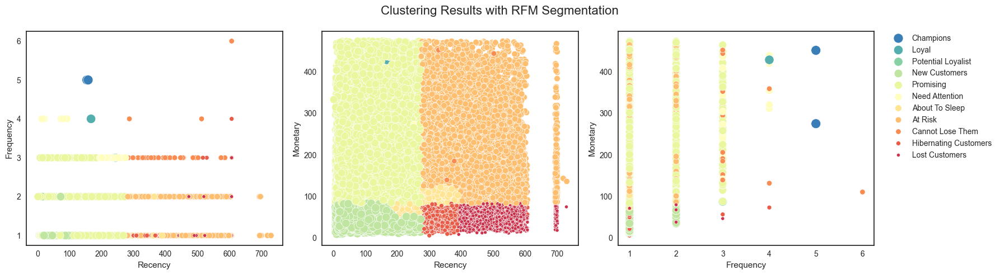

In [21]:
# Call the plot_cluster function to create scatter plots for customer segmentation analysis
plot_cluster(data=rfm_data, cluster='RFM_segment', suptitle='Clustering Results with RFM Segmentation', hue_order=segment, size='RFM_segment', sizes=(20,150), size_order=segment)

In [38]:
# Call the plot_cluster_3d function to create scatter plots for customer segmentation analysis
plot_cluster(data=rfm_data, cluster='RFM_segment', plot_3d=True, suptitle='Clustering Results with RFM Segmentation')

In [23]:
# Using a lambda function to transform values in 'RFM_segment' into 'RFM_labels' values
rfm_data['RFM_labels'] = rfm_data['RFM_segment'].apply(lambda x: 11 - segment.index(x))
rfm_data['RFM_labels'].value_counts()

7     33081
8     17809
4     17626
1      7532
2      7402
5      7121
3        44
6        30
11        2
9         1
10        1
Name: RFM_labels, dtype: int64

In [24]:
# Calculate the Silhouette score for RFM segmentation
rfm_silhouette_score = silhouette_score(rfm_data[['R_Score', 'F_Score', 'M_Score']], rfm_data['RFM_labels'])

# Print the Silhouette score
print(f"RFM Segmentation Times: {round(rfm_time, 3)} Seconds")
print(f"RFM Segmentation Silhouette score: {rfm_silhouette_score}")

RFM Segmentation Times: 0.119 Seconds
RFM Segmentation Silhouette score: 0.30327608964868324


## **K-Means Clustering**
---

K-Means Clustering is one of the algorithms in cluster analysis used to group data into clusters based on the similarity of specific features or attributes. The algorithm works by searching for cluster centers (centroids) and assigning data to the cluster with the nearest center.

Here is a more detailed explanation of K-Means Clustering:

- **Initialization**: The K-Means algorithm starts by initializing a certain number of clusters (K) desired by the user. The number K must be determined beforehand.

- **Initial Cluster Centers**: Each cluster is represented by initial centers (centroids) that are randomly chosen or based on some initialization methods like K-Means++.

- **Data Assignment**: The K-Means algorithm assigns each data point to the cluster with the closest center. The cluster centers are updated in each iteration.

- **Calculation of New Centers**: After the initial assignment, new cluster centers are calculated by taking the average of all data points within that cluster. These new centers become the updated centers for their respective clusters.

- **Iteration**: The data assignment and calculation of new centers are repeated several times (iterations) or until specific stopping criteria are met. Typically, the algorithm stops if there is no significant change in data assignments or after a certain number of iterations.

### **Tuning and Evaluation**

**Optimal Number of Clusters for KMeans**

To determine the most effective number of clusters for the KMeans clustering algorithm, we utilize the Elbow Method. This method involves plotting the variance explained as a function of the number of clusters and identifying the point where the increase in the number of clusters does not result in significantly better modeling of the data. This point is known as the "elbow".

We compute KMeans clustering with varying numbers of clusters (from 2 to 11 in our case) and visualizes the elbow point. This visualization uses the 'distortion' score, which is the sum of squared distances from each point to its assigned center. When the elbow is located, it suggests the optimal number of clusters for KMeans, balancing between cluster tightness and the number of clusters.

In addition to the Elbow Method, we can also use the Silhouette Score to assess the quality of the clusters formed by our KMeans algorithm. The Silhouette Score is a measure of how similar an object is to its own cluster (cohesion) compared to other clusters (separation). The score ranges from -1 to +1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters.

In [25]:
# Initialize the KMeans clustering algorithm with a fixed random state for reproducibility.
kmeans = KMeans(random_state=42)

In [26]:
def elbow_visualizer(model, data, metric, k=(2,11), timings=True, locate_point=True, show_value=False):
    # Set the seaborn style to 'whitegrid'
    sns.set_style('whitegrid')
    
    # Initialize the KElbowVisualizer with the provided parameters
    visualizer = KElbowVisualizer(model, k=k, metric=metric, timings=timings, locate_elbow=locate_point)
    
    # Fit the visualizer to the data
    visualizer.fit(data)
    
    # If show_value is True, display a DataFrame with k-values, metric scores, and timing information
    if show_value is True:
        display(pd.DataFrame({
            'k-Value': visualizer.k_values_,
            f'{metric.title()} Score': visualizer.k_scores_,
            'Times (second)': visualizer.k_timers_
        }))
    
    # Show the elbow plot
    visualizer.show()

,k-Value,Distortion Score,Times (second)
0,2,184935.339107,0.187557
1,3,122805.814662,0.248360
2,4,75863.206283,0.289118
3,5,63009.742729,0.299070
4,6,52173.078278,0.389988
5,7,44651.400176,0.453136
6,8,39243.770164,0.661234
7,9,34821.362442,0.708104
8,10,31626.617758,0.571581


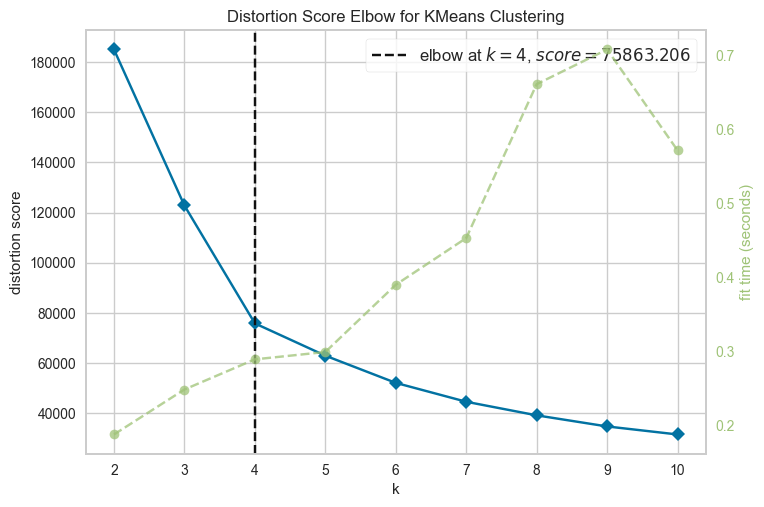

In [26]:
# Calling the elbow_visualizer using the distortion metric
elbow_visualizer(kmeans, rfm_scaled, metric='distortion', show_value=True)

- The elbow in the plot is identified at k=4, which means the optimal number of clusters for this dataset is 4. This is the point where the distortion score (the sum of squared distances from each point to its assigned center) starts to decrease more slowly, indicating that adding more clusters beyond this point does not provide significantly better fitting of the data.

- The distortion score at k=4 is approximately 75863.20. This score quantifies how much the data points deviate from their respective cluster centers. A lower distortion score generally indicates a better fit, as the points are closer to the centers of their clusters.

- The timing curve (dotted green line) shows that the time taken to fit the KMeans algorithm increases as the number of clusters increases. However, the increase in time is relatively slight, suggesting that computational efficiency is not a major concern for this range of k values for the given dataset.

- Based on this analysis, we would choose to segment the data into 4 clusters when performing KMeans clustering to balance the model's complexity with its ability to fit the data well.

,k-Value,Silhouette Score,Times (second)
0,2,0.726792,0.134403
1,3,0.373024,0.243885
2,4,0.426918,0.292815
3,5,0.385801,0.297338
4,6,0.371708,0.387840
5,7,0.384720,0.448664
6,8,0.386172,0.625986
7,9,0.385856,0.678009
8,10,0.375258,0.582601


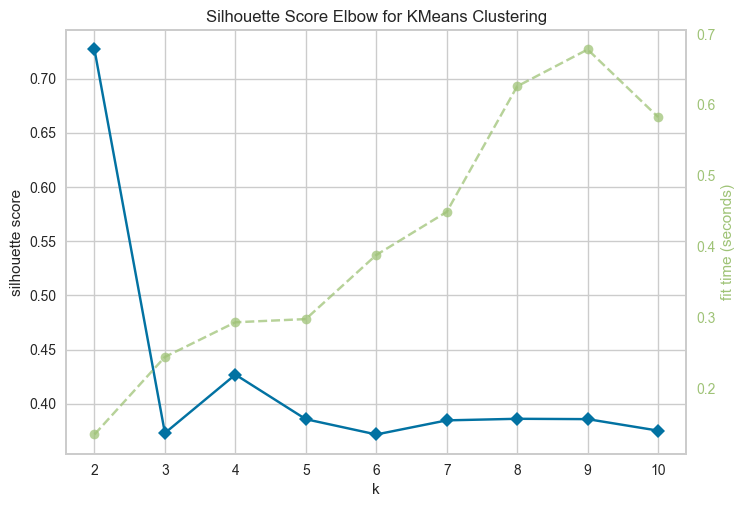

In [27]:
# Calling the elbow_visualizer using the silhouette metric
elbow_visualizer(kmeans, rfm_scaled, metric='silhouette', locate_point=False, show_value=True)

- The highest silhouette score is observed at k=2, which suggests that two clusters provide the best balance of cohesion within clusters and separation between clusters for this dataset.

- The fit time, indicated by the dotted green line, increases as the number of clusters grows. This is expected as more clusters require more calculations to determine the centroids and assign data points to the nearest cluster. The increase in fit time is not linear, and there are points where the time taken for the model to fit jumps significantly, notably after k=6.

- When there is a discrepancy between the Silhouette Score metric and the Elbow Method, consider finding a compromise between cluster quality and interpretability. While the highest Silhouette Score occurs at k=2, the high distortion at k=2 suggests that the data may not be well-segmented into two significantly different clusters.

- Besides k=2, the next highest Silhouette Score occurs at k=4. Although this may not be the primary choice based on the Silhouette Score alone, k=4 is a value that still maintains a good silhouette score while dividing the data into clusters that are more distinct than k=2

### **Visualize Cluster**

In [27]:
# Initialize KMeans clustering model
model = KMeans(n_clusters=4, random_state=42)

# Select the relevant columns from the 'rfm_data' DataFrame for clustering
kmeans_cluster = rfm_data[['customer_unique_id', 'recency', 'frequency', 'monetary']]

# Fit the KMeans model to the scaled RFM data and assign cluster labels to the 'cluster' column
start_time = time.time()
kmeans_cluster['cluster'] = model.fit_predict(rfm_scaled)
end_time = time.time()
kmeans_time= end_time - start_time

# Display the counts each cluster
kmeans_cluster['cluster'].value_counts()

0    42756
2    31038
3    14385
1     2470
Name: cluster, dtype: int64

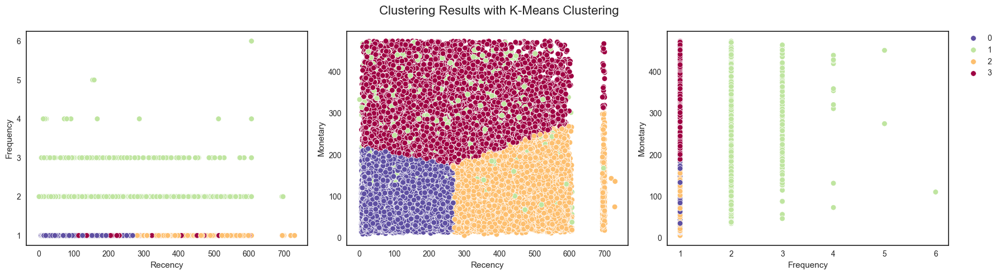

In [28]:
# Plot K-Means clustering results
plot_cluster(data=kmeans_cluster, cluster='cluster', suptitle='Clustering Results with K-Means Clustering')

In [29]:
# Plot 3D K-Means clustering results
plot_cluster(data=kmeans_cluster, cluster='cluster', plot_3d=True, suptitle='Clustering Results with K-Means Clustering')

The segmentation into five clusters using the K-Means Clustering method appears to be effective, with clear differentiation between clusters, such as:

- **Customers with High Recency and Low to Moderate Monetary Spend**: This segment consists of customers who have interacted with the company recently but their spending level is not high. These customers may be occasional buyers or relatively new customers who are in the early stages of their relationship with the business.

- **Potential Customers with Low Recency and Low to Moderate Monetary Values**: This group includes customers who have recently interacted with the business and have spent a moderate amount. They represent an opportunity for growth, and with the right engagement strategies, could become more frequent shoppers or move into a higher spending bracket.

- **High-Value 'Big Spenders'**: This cluster is characterized by customers with high monetary values, suggesting they are major contributors to the company's revenue. They are likely to be the most valued customers, and maintaining their engagement is crucial. Tailored incentives and personalized experiences could be effective in retaining these customers.

- **Loyal Customers with Multiple Purchases**: Represented by a higher frequency, this group of customers demonstrates loyalty through their repeat business. They are vital to the company due to their recurring engagement and are ideal candidates for loyalty rewards and exclusive offers.

In summary, the segmentation provides a strategic overview of customer behavior, with each cluster representing a different level of opportunity and engagement for the business. The insights can inform targeted marketing campaigns, sales strategies, and customer service enhancements to capitalize on the unique characteristics of each segment.

In [30]:
# Calculate the Silhouette score for K-Means clustering
kmeans_silhouette_score = silhouette_score(rfm_scaled, kmeans_cluster['cluster'])

# Print the Silhouette score
print(f"K-Means Clustering Times: {round(kmeans_time, 3)} Seconds")
print(f"K-Means Clustering Silhouette score: {kmeans_silhouette_score}")

K-Means Clustering Times: 0.356 Seconds
K-Means Clustering Silhouette score: 0.4269179642065565


## **Agglomerative Clustering**
---

Agglomerative Clustering is a hierarchical clustering algorithm used in data analysis and data mining to group similar data points into clusters or groups. This algorithm follows a "bottom-up" or "agglomerative" approach, where it starts with each data point as its own cluster and then iteratively merges clusters together based on their similarity until a single main cluster is formed.

Here are the key steps in Agglomerative Clustering:

- **Initialization**: Each data point is initially treated as a single cluster, so the number of clusters is equal to the number of data points.

- **Similarity Measurement**: The algorithm calculates the similarity or dissimilarity between clusters. Various distance metrics, such as Euclidean distance, Manhattan distance, or other similarity measures, can be used to quantify the dissimilarity between clusters.

- **Cluster Merging**: The two clusters that are most similar to each other, based on the chosen similarity measure, are merged into a single cluster. This process continues iteratively until only one primary cluster remains. The order of merging is typically recorded, allowing the creation of a hierarchical structure or dendrogram.

- **Dendrogram**: The hierarchical structure of clusters is often represented as a dendrogram, which is a tree-like diagram that shows the sequence of cluster merges. This dendrogram can be useful for visualizing the hierarchy of clusters and for determining the optimal number of clusters at various levels of granularity.

- **Stopping Criteria**: The clustering process stops when certain stopping criteria are met. Common stopping criteria include reaching a predetermined number of clusters or when the dissimilarity between clusters exceeds a certain threshol

### **Tuning and Evaluation**

Similar to the approach taken with K-Means, we utilize both the Elbow Method and the Silhouette Score to determine the optimal number of clusters for the agglomerative clustering model. However, for agglomerative clustering, we also incorporate insights from the dendrogram to ascertain the best value for kk. The dendrogram provides a visual representation of the agglomeration process, which complements the quantitative methods by highlighting the points of significant merge, thus aiding in the determination of the most appropriate number of clusters.

In [31]:
# Initialize model
agglomerative= AgglomerativeClustering(linkage='ward', compute_distances=True, compute_full_tree=True)

# Create sample dataframe
sample_cleaned = rfm_data[['customer_unique_id', 'recency', 'frequency', 'monetary']].sample(frac=0.2, random_state=42)
sample_scaled = pd.DataFrame(data=scaler.fit_transform(sample_cleaned[['recency','frequency','monetary']]), columns=['recency', 'frequency', 'monetary'])

Sample allocation in the context of the Agglomerative Clustering algorithm is an approach used to address computational challenges when dealing with a large amount of data. Our data consists of 96,000 rows, which can consume a significant amount of computational resources and time to be processed by the Agglomerative Clustering algorithm.

,k-Value,Distortion Score,Times (second)
0,2,36881.649568,6.102146
1,3,26636.321729,6.168848
2,4,16911.742677,6.242535
3,5,13659.572118,6.165410
4,6,11875.045752,6.008128
5,7,10186.902748,6.544557
6,8,9137.469269,6.001295
7,9,8389.097014,5.934080
8,10,7646.831497,5.876414


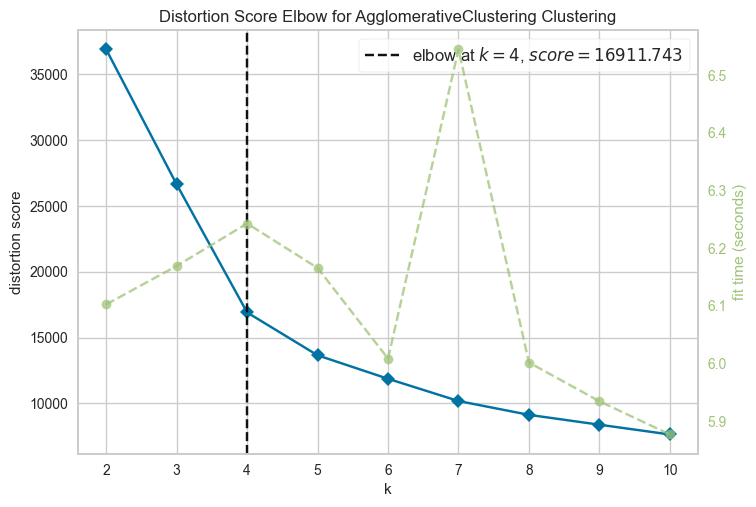

In [31]:
# Calling the elbow_visualizer using the distortion metric
elbow_visualizer(agglomerative, sample_scaled, metric='distortion', show_value=True)

- The distortion score drastically decreases as the number of clusters increases from 2 to 3 and then to 4, indicating a significant improvement in clustering quality with each additional cluster.

- The "elbow" point is at k=4, where the rate of decrease in the distortion score starts to level off. This is highlighted by the dashed vertical line and is where the score is annotated as 16911.74. The elbow method suggests that after this point, adding more clusters does not significantly improve the model's performance, which is why k=4 is suggested as the optimal number of clusters.

- In some cases, a slight elbow may be visible at other points (such as k=5), which can also be considered, but we can also look at other metrics such as fitting time for consideration

,k-Value,Silhouette Score,Times (second)
0,2,0.722185,6.222414
1,3,0.413604,6.178820
2,4,0.376286,6.008156
3,5,0.323792,6.027108
4,6,0.323569,6.079624
5,7,0.311712,5.856947
6,8,0.313093,5.852230
7,9,0.315252,5.780556
8,10,0.292695,5.742342


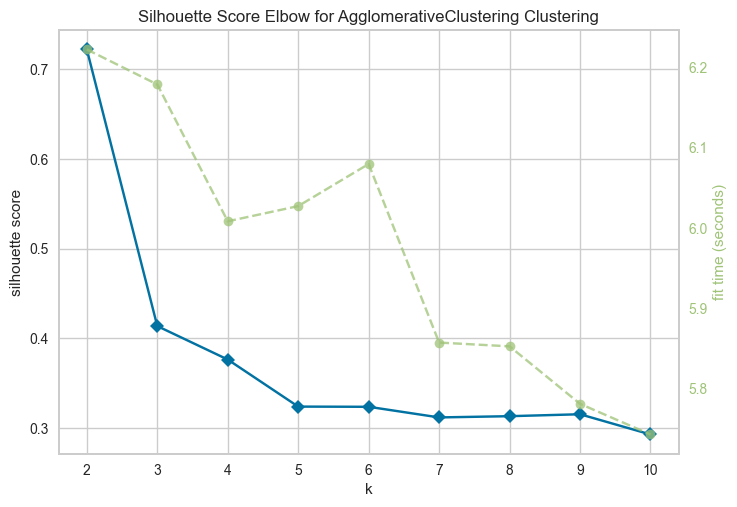

In [32]:
# Calling the elbow_visualizer using the silhouette metric
elbow_visualizer(agglomerative, sample_scaled, metric='silhouette', locate_point=False, show_value=True)

- The silhouette score is highest for k=2, indicating that two clusters have the most distinct separation. This high score suggests that at k=2, the clusters are well apart from each other and dense internally.

- The fitting time for Agglomerative Clustering decreases with the increase in the number of clusters (k) up to k=5 and then starts to increase.

- There are differences between the Silhouette Score and Elbow Method metrics, consider finding a compromise between cluster quality and interpretability. Although the highest Silhouette Score occurs at k=2, the high distortion at k=2 indicates that the data may not be well segmented into two significantly different groups

- Apart from k=2, we can consider k=4 with the best elbow score even though this may not be the main choice based on the Silhouette Score, but the silhouette score is still relatively good at around 0.3762 which can still be compromised with the good elbow score.

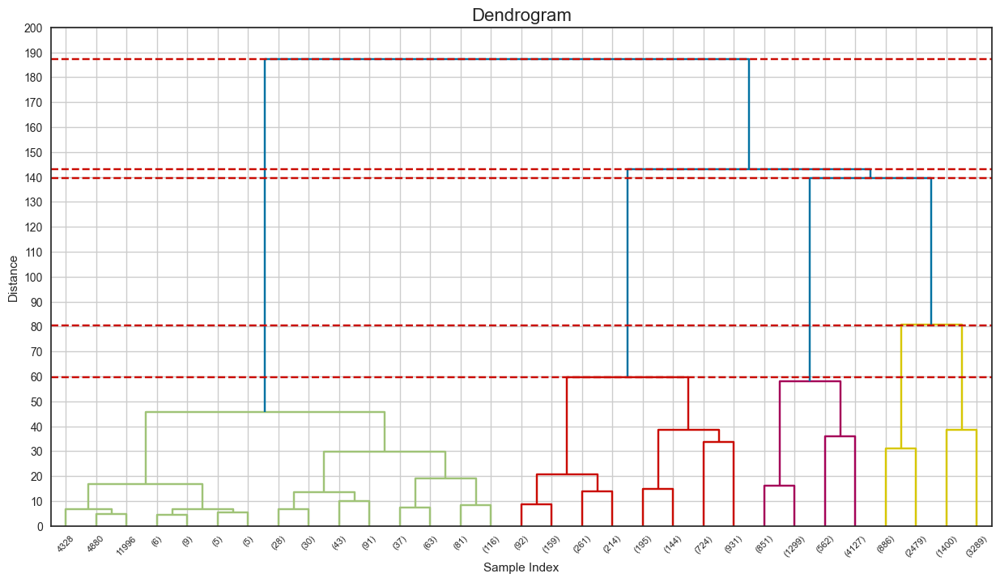

In [32]:
# Calculating linkage matrix
linkage_matrix = linkage(sample_scaled, method='ward')

# Plotting dendrogram
plt.figure(figsize=(15, 8))
dendrogram(linkage_matrix, truncate_mode='level', p=4)
plt.axhline(y=187.3, color='r', linestyle='--')
plt.axhline(y=143, color='r', linestyle='--')
plt.axhline(y=139.5, color='r', linestyle='--')
plt.axhline(y=80.6, color='r', linestyle='--')
plt.axhline(y=59.8, color='r', linestyle='--')
plt.title('Dendrogram', fontsize=16)
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.yticks(np.arange(0, 201, 10))
plt.grid()
plt.show()

- **2 Clusters**: The distance between the two largest clusters is approximately 44.3 (187.3-143). This indicates a significant difference between two main customer segments in your data, which could represent two groups of customers with very distinct RFM characteristics.

- **3 Clusters**: The distance between the second and third clusters is about 3.5 (143-139.5), which is quite small and may suggest that the third cluster does not offer a significant separation from the second cluster. In practical terms, adding a third cluster might not provide additional meaningful insights because the difference between the second and third clusters is not very clear.

- **4 Clusters**: The distance for forming the fourth cluster is approximately 58.9 (139.5-80.6), indicating a relatively large difference between these clusters. This significant difference suggests that each cluster has quite unique characteristics, and thus, four clusters can provide a good understanding of customer segmentation in your data. This becomes the more appropriate choice if the goal of the analysis is to capture a broader variation in customer behavior.

- **5 Cluster**s: The distance for the fifth cluster is about 20.8 (80.6-59.8). Although this is smaller than the distance for the fourth cluster, it still indicates a sufficient difference to consider the fifth cluster as a separate customer segment. However, the smaller difference may suggest that this additional cluster is not as distinctly separated as the previous ones.

Based on the analysis of distances in the dendrogram, the best option is to choose 4 clusters. The reason for this choice is because the distance between the fourth cluster indicates a significant difference, signaling that each cluster represents different customer segments with clear RFM characteristics. 

### **Visualize cluster**

In [33]:
# Initialize AgglomerativeClustering model with 4 Cluster
agglomerative = AgglomerativeClustering(n_clusters=4, linkage='ward', compute_distances=True, compute_full_tree=True)

# Create a copy of the 'sample_cleaned' DataFrame to avoid modifying the original data
agglo_cluster = sample_cleaned.copy()

# Fit the AgglomerativeClustering model to the scaled data and assign cluster labels to the 'cluster' column
start_time = time.time()
agglo_cluster['cluster'] = agglomerative.fit_predict(sample_scaled)
end_time = time.time()
agglo_time= end_time - start_time

# Count the number of data points in each cluster and display the counts
agglo_cluster['cluster'].value_counts()

0    8054
1    6839
2    2720
3     517
Name: cluster, dtype: int64

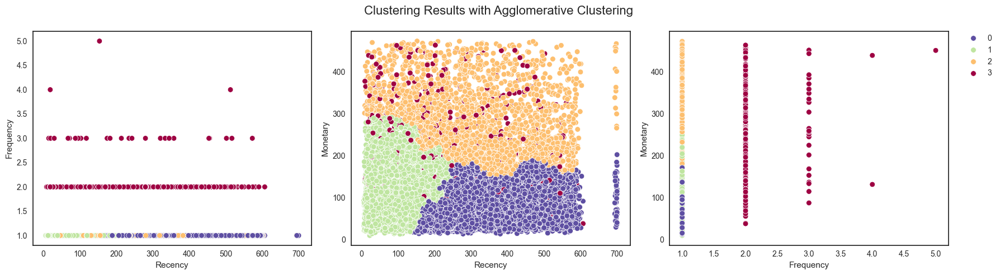

In [34]:
# Plot Agglomerativeclustering results
plot_cluster(data=agglo_cluster, cluster=agglo_cluster['cluster'], suptitle='Clustering Results with Agglomerative Clustering')

In [35]:
# Plot 3D Agglomerativeclustering results
plot_cluster(data=agglo_cluster, cluster=agglo_cluster['cluster'], plot_3d=True, suptitle='Clustering Results with Agglomerative Clustering')

The segmentation into five clusters using the Agglomerative Clustering method appears to be effective, with clear differentiation between clusters, such as:

- **Cluster of Customers with High Recency and Low Monetary Spend**: This group represents customers who have interacted with the business recently but have not spent much. They might be occasional shoppers or new customers who are testing the products or services.

- **Potential Customers with Low Recency and Low to Moderate Monetary Spend**: Customers in this segment have engaged with the business recently and have spent a moderate amount. They have the potential to become more valuable customers with the right incentives and engagement strategies.

- **'Big Spenders' Cluster with High Monetary Values**: This segment includes customers who have spent significantly, contributing a substantial portion to the revenue. They are crucial to the business and may be offered premium services or loyalty rewards to maintain their engagement.

- **'Loyalists' Cluster with Frequency Greater than One**: This group comprises repeat customers who have made multiple purchases. Their continued patronage signifies their loyalty, making them prime candidates for loyalty programs and other retention tactics.

Each of these clusters has distinct characteristics that can be leveraged for tailored marketing strategies, customer engagement, and retention initiatives.

In [36]:
# Calculate the Silhouette score for Agglomerative clustering
agglo_silhouette_score = silhouette_score(sample_scaled, agglo_cluster['cluster'])

# Print the Silhouette score
print(f"Agglomerative Clustering Times: {round(agglo_time, 3)} Seconds")
print(f"Agglomerative Clustering Silhouette score: {agglo_silhouette_score}")

Agglomerative Clustering Times: 6.452 Seconds
Agglomerative Clustering Silhouette score: 0.37628622556164193


# **Summary**

In [37]:
pd.DataFrame({
        'Model': ['RFM Segmentation', 'K-Means Clustering', 'Agglomerative Clustering'],  
        'Silhouette Score': [rfm_silhouette_score.round(3), kmeans_silhouette_score.round(3), agglo_silhouette_score.round(3)],  
        'Training Time(s)': [round(rfm_time, 3), round(kmeans_time, 3), round(agglo_time, 3)]  
    })

,Model,Silhouette Score,Training Time(s)
0,RFM Segmentation,0.303,0.119
1,K-Means Clustering,0.427,0.356
2,Agglomerative Clustering,0.376,6.452


**RFM Segmentation**:

- Advantages:
    - Suitable for marketing strategies that adapt to known customer behavior.
    - Implementation and segmentation are very easy to understand
    - Scalable for large datasets
    - Short time complexity
    - Robust against outliers

- Disadvantages:
    - Subjective as it requires manual threshold setting.
    - May not capture more complex customer behavior patterns as effectively as algorithmic methods.
    - Has the lowest evaluation metric performance when compared to K-Means and Agglomerative.

**K-Means Clustering**:

- Advantages:
    - Computationally efficient, especially on large datasets.
    - Creates compact and dense clusters.

- Disadvantages:
    - Susceptible to outliers
    - Sensitive to initial centroid placement.
    - Cannot segment more than one frequency (frequencies that are more than 1 become one cluster)

**Agglomerative Clustering**:

- Advantages:
    - Produces an informative cluster tree (dendrogram).
    - Does not require pre-determination of the number of clusters.
    - Can reveal data structure at various levels.

- Disadvantages:
    - Has higher time complexity.
    - May not be as scalable with large datasets as K-Means.
    - Cannot segment more than one frequency (frequencies that are more than 1 become one cluster)

Even though K-Means Clustering is the best according to the silhouette score metric with a score of 0.427, because K-Means cannot cluster frequencies that are more than 1 in more than one cluster, RFM Segmentation is used for further analysis which will be related to marketing strategy.